# Exploratory Spatio-Temporal Data Analysis
# Part 2 - Descriptive Statistics - Yearly Summary Statistics

In [2]:
import gc

import numpy as np
import pandas as pd
import polars as pl

import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns

import cartopy.crs as ccrs
import cartopy.feature as cfeature

from statsmodels.tsa.seasonal import seasonal_decompose

import folium
from mpl_toolkits.basemap import Basemap

%matplotlib inline

In [3]:
# ds = xr.open_dataset('data/preprocessed_power_nasa_data.nc')

In [4]:
# ds

In [5]:
polars_df = pl.read_parquet("/workspace/soil-ml-modeling-pipeline/ml-modeling-pipeline/data/02_intermediate/preprocessed_power_nasa_data.parquet")

In [6]:
polars_df

time,lat,lon,EVPTRNS,T2M,TS,PS,WS2M,WS10M,QV2M,RH2M,GWETROOT,GWETPROF,GWETTOP,CLOUD_AMT,ALLSKY_SFC_SW_DWN,PRECTOTCORR_mm
datetime[ns],f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
2001-01-01 00:00:00,-11.5,35.0,35.578125,25.404688,300.203125,92057.3125,1.9765625,2.5234375,0.015808,72.1875,0.640625,0.6328125,0.65625,94.207031,178.519531,0.951856
2001-01-01 00:00:00,-11.5,35.625,74.953125,25.084375,298.835938,93466.0,1.859375,2.8046875,0.016235,77.8125,0.671875,0.6640625,0.6875,96.116211,186.345703,1.583561
2001-01-01 00:00:00,-11.5,36.25,65.9375,24.951563,298.679688,94211.625,2.4140625,3.515625,0.016052,78.3125,0.6796875,0.671875,0.6953125,94.080078,186.628906,2.690817
2001-01-01 00:00:00,-11.5,36.875,67.171875,24.865625,298.59375,95146.0,2.6484375,3.8125,0.016296,80.4375,0.6875,0.671875,0.703125,92.205078,197.992188,4.040025
2001-01-01 00:00:00,-11.5,37.5,46.96875,24.904688,298.46875,96108.0,2.6015625,3.8203125,0.016663,82.25,0.6171875,0.59375,0.6640625,90.4375,216.742188,3.829511
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
2024-01-01 00:00:00,22.0,34.375,0.015625,19.514063,293.992188,96891.25,2.0546875,3.078125,0.007141,53.375,0.2578125,0.2578125,0.1875,0.15625,213.762695,0.0
2024-01-01 00:00:00,22.0,35.0,0.0,18.514063,293.1875,94504.25,2.03125,2.9609375,0.008423,64.9375,0.3125,0.3125,0.2421875,0.650391,213.164062,0.00001
2024-01-01 00:00:00,22.0,35.625,0.0,18.514063,293.882812,94149.25,2.4140625,3.2890625,0.009277,70.25,0.3203125,0.3203125,0.1640625,1.822266,211.628906,0.0


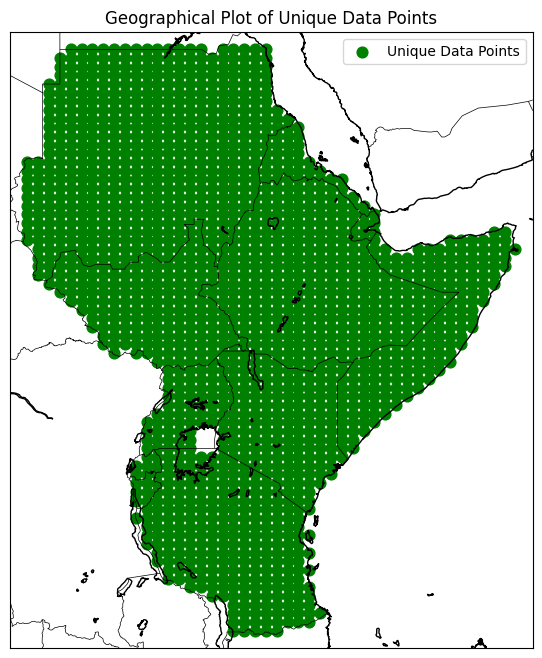

In [7]:
def plot_geographical_data(polars_df: pl.DataFrame):
    """
    Plots unique geographical data points on a map from a Polars DataFrame containing latitude and longitude.

    Parameters:
    - polars_df (pl.DataFrame): A Polars DataFrame with 'lat' and 'lon' columns.

    Author:
    - Adam Przychodni
    """
    # Ensure the DataFrame has the necessary columns
    if not {'lat', 'lon'}.issubset(polars_df.columns):
        raise ValueError("DataFrame must contain 'lat' and 'lon' columns")

    # Select the latitude and longitude columns and get unique pairs
    unique_coords = polars_df.select(['lat', 'lon']).unique()

    # Extract longitude and latitude columns from the unique coordinates
    lons = unique_coords.get_column('lon').to_numpy()
    lats = unique_coords.get_column('lat').to_numpy()

    # Set up the plot with a specified size
    fig, ax = plt.subplots(figsize=(12, 8))

    # Create a Basemap instance with a cylindrical projection
    m = Basemap(projection='cyl', llcrnrlon=lons.min() - 1, llcrnrlat=lats.min() - 1,
                urcrnrlon=lons.max() + 1, urcrnrlat=lats.max() + 1, resolution='i', ax=ax)

    # Draw coastlines and countries for better map visualization
    m.drawcoastlines()
    m.drawcountries()

    # Convert latitude and longitude to map projection coordinates
    x, y = m(lons, lats)

    # Plot the data points with a green color, 'o' marker, and size of 60
    m.scatter(x, y, color='green', label='Unique Data Points', marker='o', s=60)

    # Add a legend and a title to the plot
    plt.legend()
    plt.title('Geographical Plot of Unique Data Points')

    # Display the plot
    plt.show()

    # Close the plot to free up memory
    plt.close(fig)
    
    # Explicitly delete variables and collect garbage
    del m, x, y, lons, lats, unique_coords, fig, ax
    gc.collect()

# Example usage:
plot_geographical_data(polars_df)


## Descriptive statistics

### Summmary statistics

#### Yearly Summary Statistics

In [8]:
# Select columns to exclude from summary statistics
columns_to_exclude = ["time", "lat", "lon"]

# Define the aggregations to perform for each of the other columns dynamically
aggregations = []
for col in polars_df.columns:
    if col not in columns_to_exclude:
        aggregations.extend([
            pl.col(col).mean().alias(f"{col}_mean"),
            pl.col(col).std().alias(f"{col}_std"),
            pl.col(col).min().alias(f"{col}_min"),
            pl.col(col).max().alias(f"{col}_max"),
            pl.col(col).median().alias(f"{col}_median"),
            pl.col(col).quantile(0.25).alias(f"{col}_q25"),
            pl.col(col).quantile(0.75).alias(f"{col}_q75")
        ])

# Group by year and aggregate
annual_stats_df = polars_df.group_by(pl.col("time").dt.year()).agg(aggregations)
annual_stats_df = annual_stats_df.sort("time")

In [9]:
annual_stats_df

time,EVPTRNS_mean,EVPTRNS_std,EVPTRNS_min,EVPTRNS_max,EVPTRNS_median,EVPTRNS_q25,EVPTRNS_q75,T2M_mean,T2M_std,T2M_min,T2M_max,T2M_median,T2M_q25,T2M_q75,TS_mean,TS_std,TS_min,TS_max,TS_median,TS_q25,TS_q75,PS_mean,PS_std,PS_min,PS_max,PS_median,PS_q25,PS_q75,WS2M_mean,WS2M_std,WS2M_min,WS2M_max,WS2M_median,WS2M_q25,WS2M_q75,WS10M_mean,…,GWETROOT_q25,GWETROOT_q75,GWETPROF_mean,GWETPROF_std,GWETPROF_min,GWETPROF_max,GWETPROF_median,GWETPROF_q25,GWETPROF_q75,GWETTOP_mean,GWETTOP_std,GWETTOP_min,GWETTOP_max,GWETTOP_median,GWETTOP_q25,GWETTOP_q75,CLOUD_AMT_mean,CLOUD_AMT_std,CLOUD_AMT_min,CLOUD_AMT_max,CLOUD_AMT_median,CLOUD_AMT_q25,CLOUD_AMT_q75,ALLSKY_SFC_SW_DWN_mean,ALLSKY_SFC_SW_DWN_std,ALLSKY_SFC_SW_DWN_min,ALLSKY_SFC_SW_DWN_max,ALLSKY_SFC_SW_DWN_median,ALLSKY_SFC_SW_DWN_q25,ALLSKY_SFC_SW_DWN_q75,PRECTOTCORR_mm_mean,PRECTOTCORR_mm_std,PRECTOTCORR_mm_min,PRECTOTCORR_mm_max,PRECTOTCORR_mm_median,PRECTOTCORR_mm_q25,PRECTOTCORR_mm_q75
i32,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,…,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
2001,9.05929,19.182359,0.0,151.046875,0.0546875,0.0,6.2109375,25.61885,4.791671,8.248438,39.1625,25.982813,22.44375,28.904688,300.278946,5.272418,281.421875,317.265625,300.578125,296.796875,303.84375,92520.81256,5279.480668,72328.8125,101816.125,94300.125,89062.5,96155.5625,2.916371,1.430812,0.0,11.0625,2.75,1.828125,3.796875,4.054404,…,0.34375,0.5546875,0.443492,0.154168,0.0859375,0.984375,0.4453125,0.34375,0.5625,0.318138,0.216981,0.0234375,0.9921875,0.28125,0.1328125,0.4921875,47.301692,29.935482,-12.425781,107.885742,46.078125,20.227539,73.53125,249.227845,46.810767,38.9375,369.414062,253.654297,222.558594,280.964844,1.314294,3.306016,0.0,175.905745,0.029954,0.0,1.078655
2002,7.622051,17.314316,0.0,151.484375,0.046875,0.0,4.5390625,25.997965,4.971199,4.514063,40.725,26.2875,22.740625,29.404688,300.696186,5.410935,278.171875,319.820312,300.953125,297.140625,304.335938,92539.995764,5277.580916,72307.875,101842.5,94298.9375,89085.4375,96158.125,2.948517,1.421799,0.0,10.65625,2.765625,1.875,3.8359375,4.095466,…,0.34375,0.546875,0.438146,0.148289,0.0859375,0.9765625,0.4453125,0.34375,0.5546875,0.306407,0.210468,0.015625,1.0,0.2734375,0.1171875,0.4765625,48.319702,29.491489,-7.253906,105.225586,48.199219,21.899414,73.857422,250.864553,46.472464,27.570312,368.449219,254.287109,224.016113,282.721191,1.329276,3.457441,0.0,131.143455,0.023536,0.0,0.982996
2003,7.902208,17.410737,0.0,151.148438,0.09375,0.0,5.53125,26.004383,4.755919,7.154688,40.748438,26.248438,22.928125,29.209375,300.638526,5.207289,280.882812,318.78125,300.796875,297.289062,304.125,92530.629519,5273.660424,72383.8125,101738.75,94297.625,89071.6875,96152.625,2.944076,1.410556,0.0,12.382812,2.78125,1.890625,3.796875,4.096596,…,0.34375,0.546875,0.442581,0.149898,0.0859375,0.9921875,0.453125,0.3515625,0.5546875,0.317593,0.212233,0.015625,0.9921875,0.296875,0.1171875,0.484375,48.378495,29.010598,-16.738281,103.723633,47.572266,23.049805,73.333008,252.611204,44.883766,38.538086,364.40625,257.425781,227.421875,283.9375,1.306301,3.501703,0.0,151.137301,0.0216,0.0,0.974789
2004,7.935641,18.042215,0.0,169.726562,0.046875,0.0,4.3671875,25.895991,4.892129,6.748438,40.1,26.232813,22.592188,29.310938,300.541345,5.344304,280.914062,318.125,300.851562,296.921875,304.234375,92542.064267,5276.421484,72298.6875,101862.6875,94309.84375,89093.25,96164.75,2.966904,1.447708,0.0,11.351562,2.7734375,1.8828125,3.859375,4.125373,…,0.34375,0.546875,0.440433,0.1513,0.0859375,0.96875,0.453125,0.34375,0.5546875,0.314196,0.212845,0.0234375,1.0,0.2890625,0.125,0.4765625,44.683572,29.485522,-14.095703,104.214844,41.888672,18.129883,69.875488,253.064511,44.67964,29.353516,360.982422,256.453125,226.90332,284.073242,1.382049,3.531154,0.0,173.849208,0.030798,0.0,1.085998
2005,9.26342

In [11]:
import plotly.express as px
df = annual_stats_df.to_pandas()
# Create a scatter plot
fig = px.scatter(df, x='PRECTOTCORR_mm_mean', y='GWETROOT_mean', title='Scatter Plot between Two Variables', trendline='ols')

# Show the plot
fig.show()

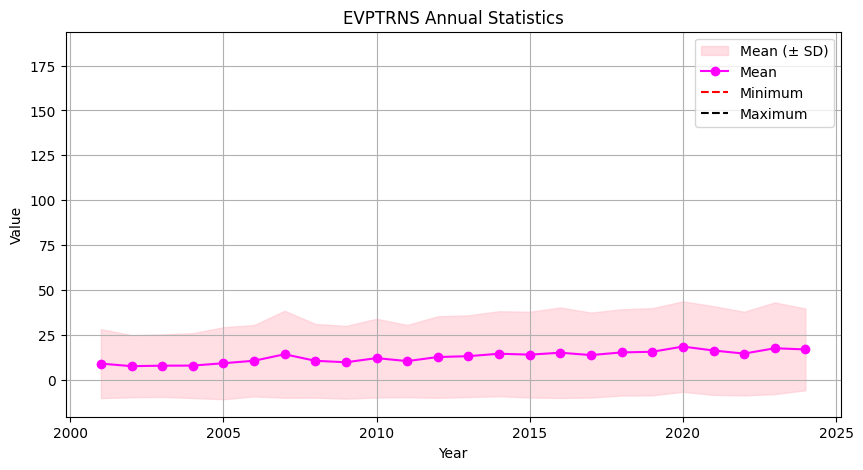

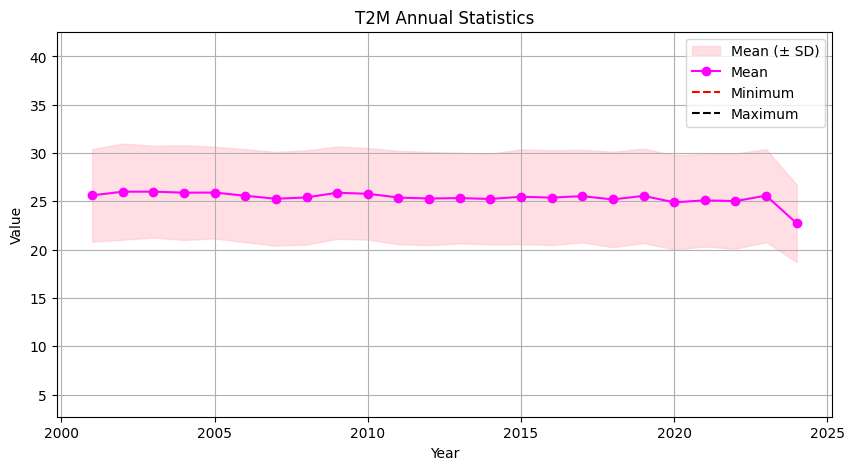

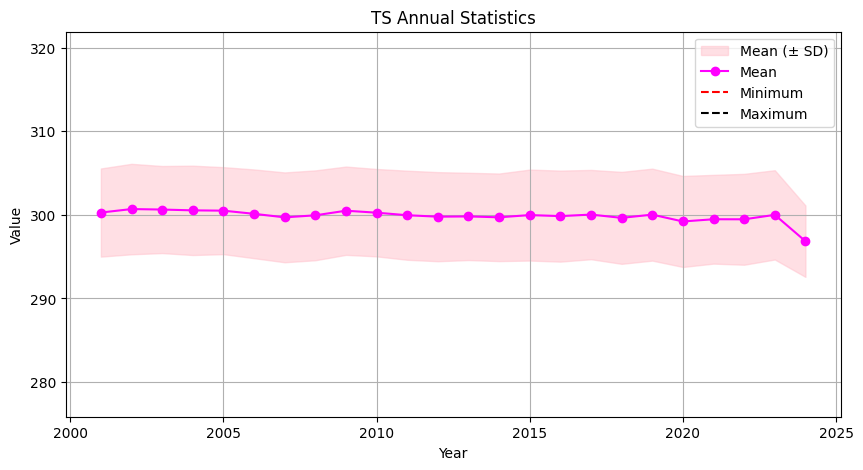

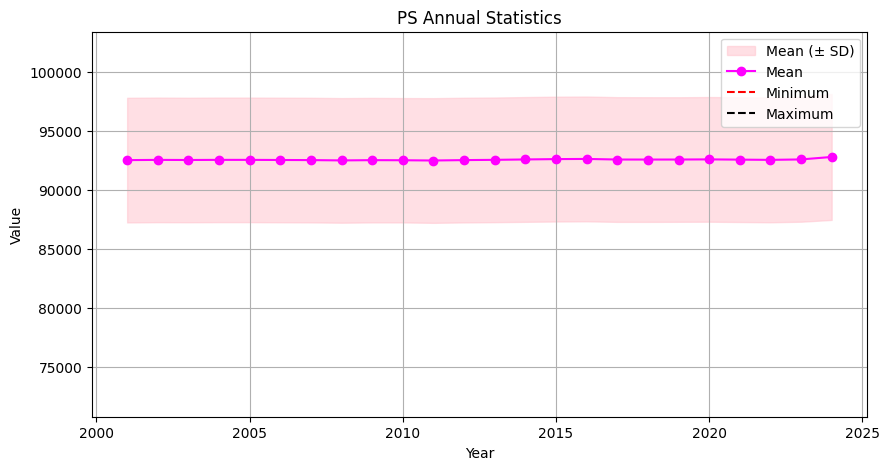

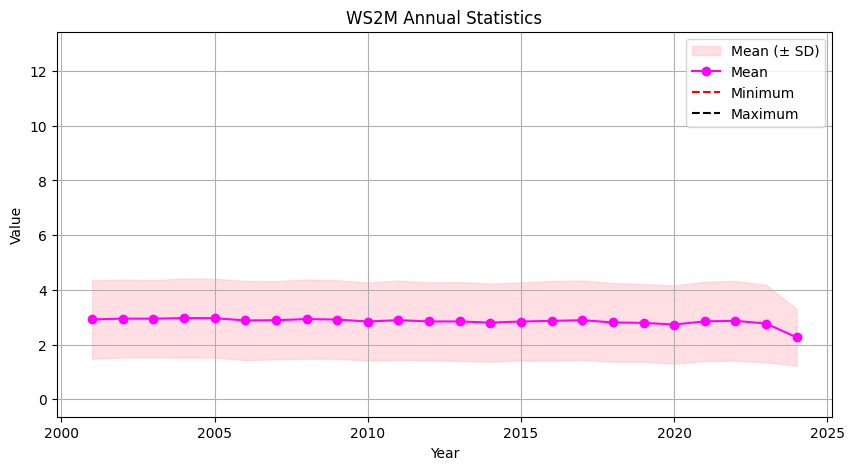

...

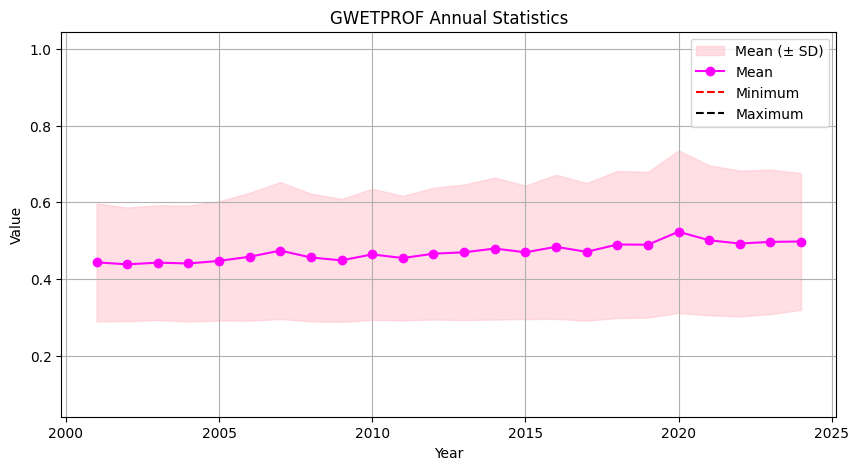

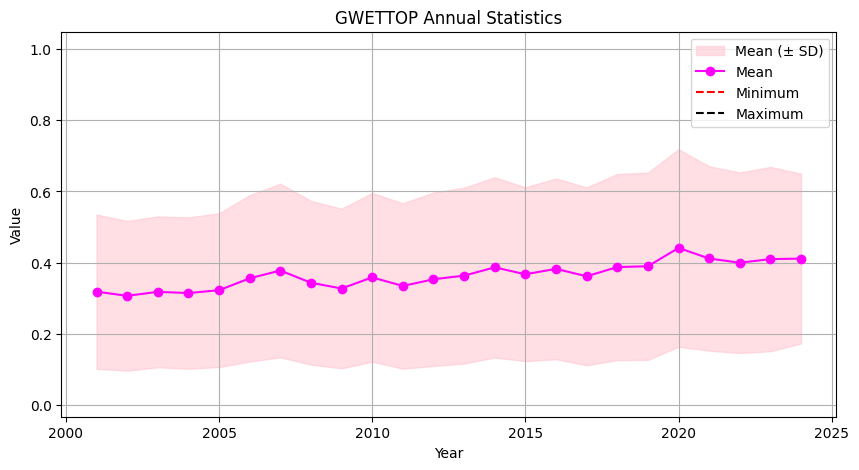

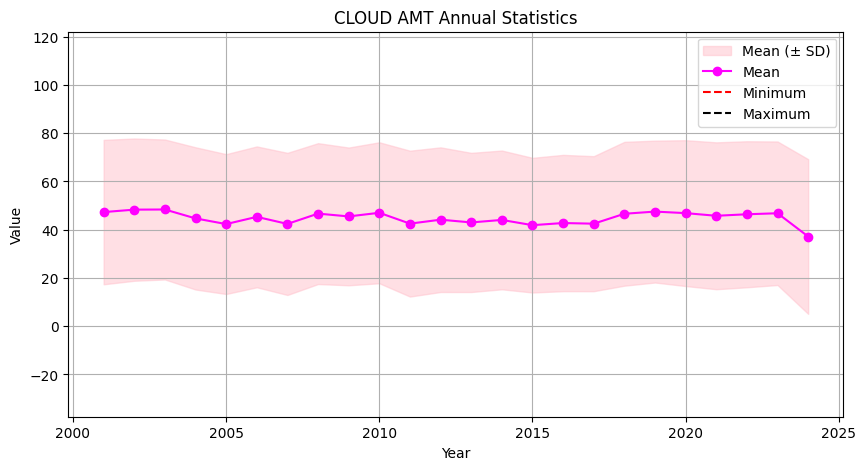

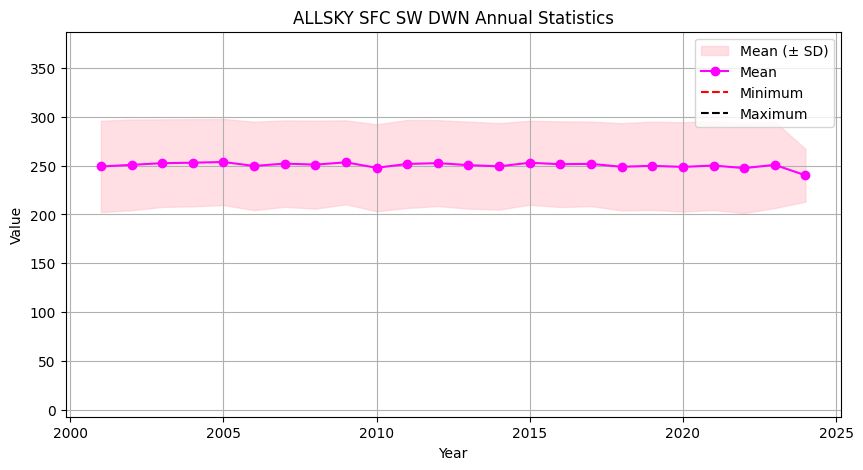

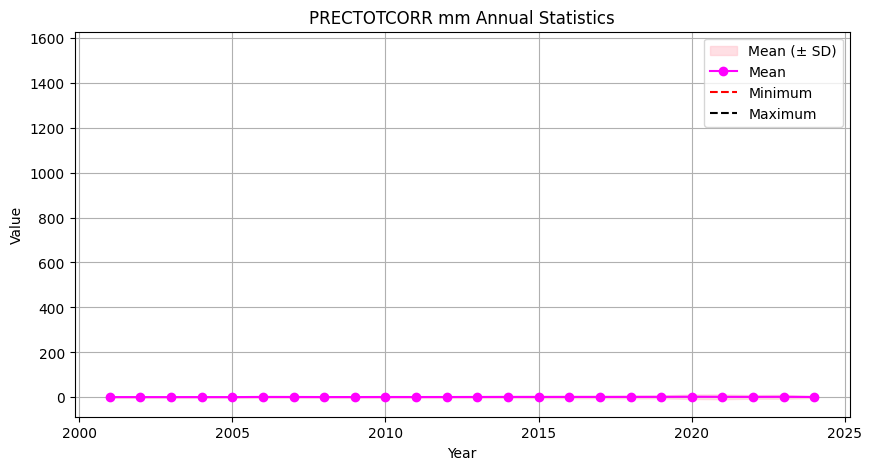

In [10]:
import matplotlib.pyplot as plt
import polars as pl

def plot_annual_stats(annual_stats_df):
    """
    This function will loop through each group of variable statistics in the DataFrame and
    create a separate plot for each one, maintaining the order they appear in the DataFrame.

    Args:
    - annual_stats_df (pl.DataFrame): DataFrame with annual statistics for each variable.
    """
    # List all variables by identifying prefixes from the mean columns specifically,
    # and maintain their original order
    variables = [col.split('_mean')[0] for col in annual_stats_df.columns if '_mean' in col]

    # Plot each variable
    for var in variables:
        try:
            # Extract relevant statistics for the current variable
            time = annual_stats_df['time']
            mean = annual_stats_df[f'{var}_mean']
            std = annual_stats_df[f'{var}_std']
            min_val = annual_stats_df[f'{var}_min']
            max_val = annual_stats_df[f'{var}_max']

            # Calculate mean ± std for the shaded area
            mean_plus_std = mean + std
            mean_minus_std = mean - std

            # Plotting
            plt.figure(figsize=(10, 5))
            plt.fill_between(time, mean_minus_std, mean_plus_std, color='pink', alpha=0.5, label='Mean (± SD)')
            plt.plot(time, mean, 'o-', color='magenta', label='Mean')
            plt.hlines(min_val, time, time, colors='red', linestyles='dashed', label='Minimum')
            plt.hlines(max_val, time, time, colors='black', linestyles='dashed', label='Maximum')

            # Adding labels and title
            plt.title(f"{var.replace('_', ' ')} Annual Statistics")
            plt.xlabel('Year')
            plt.ylabel('Value')
            plt.legend()
            plt.grid(True)
            plt.show()

        except KeyError as e:
            print(f"Could not plot variable {var}: {e}")

# Assuming 'annual_stats_df' is your dataframe, you can call the function directly
plot_annual_stats(annual_stats_df)


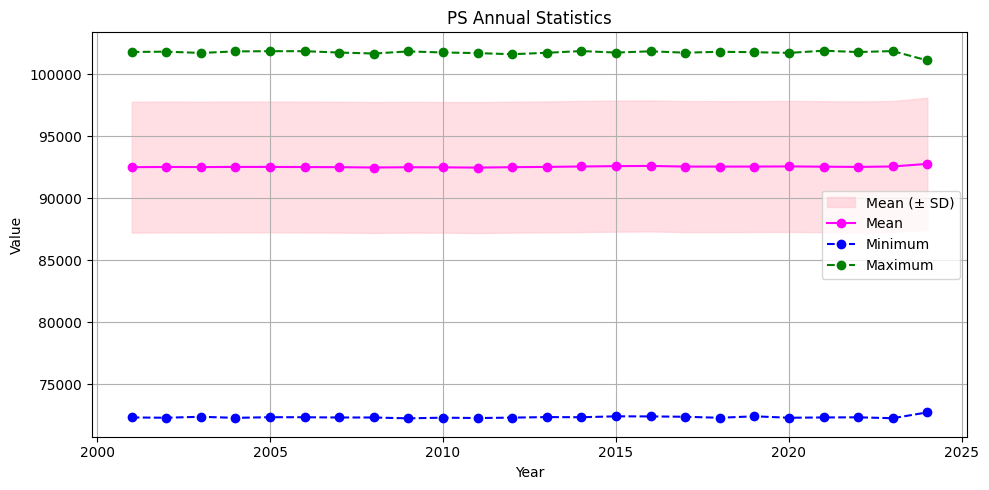

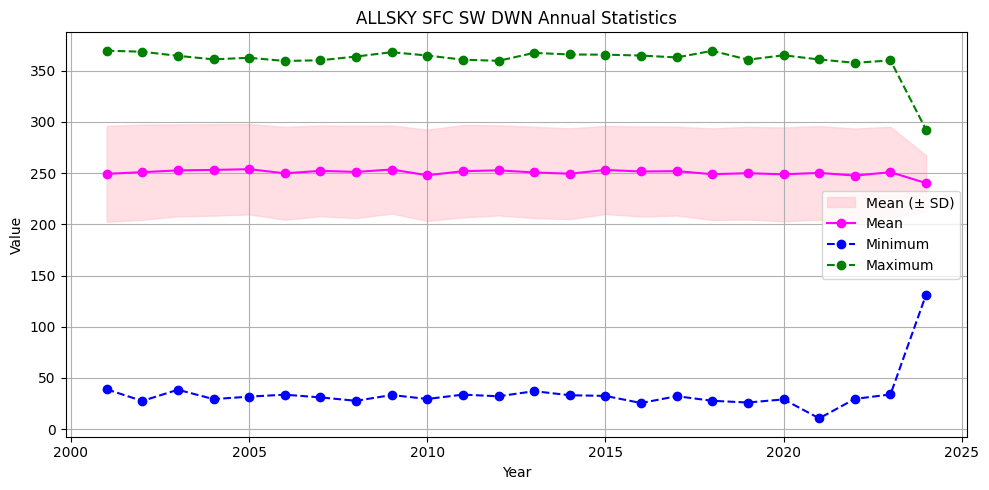

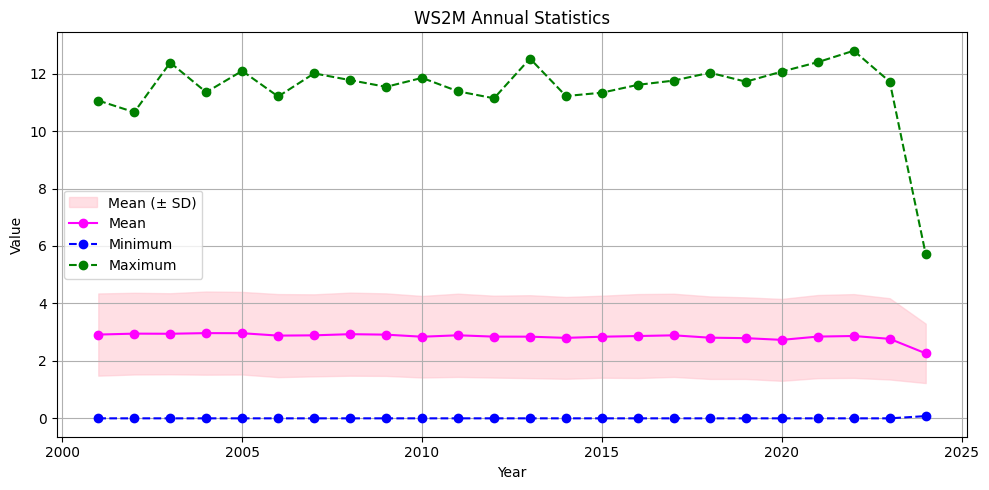

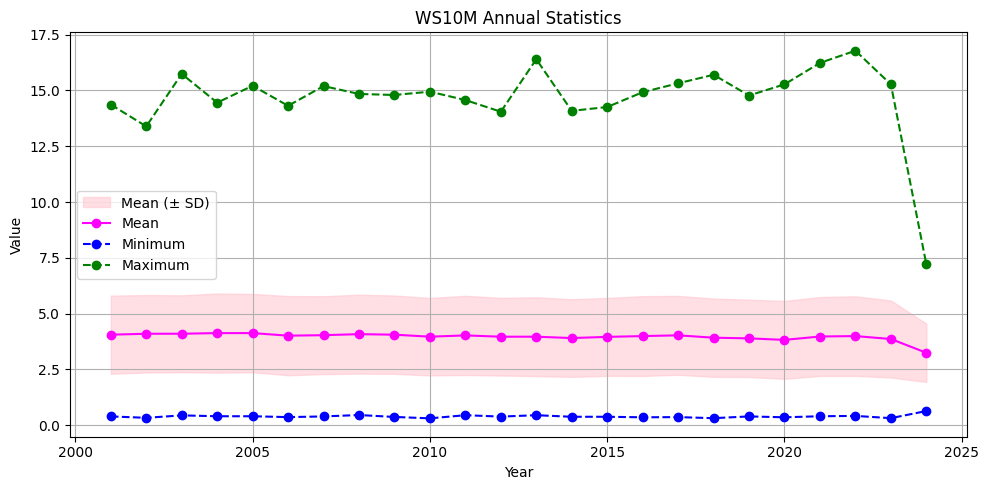

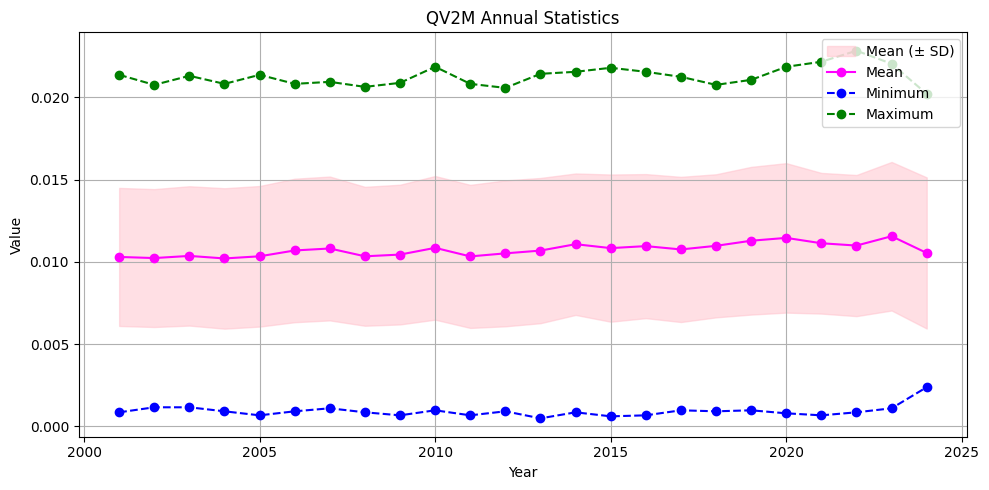

...

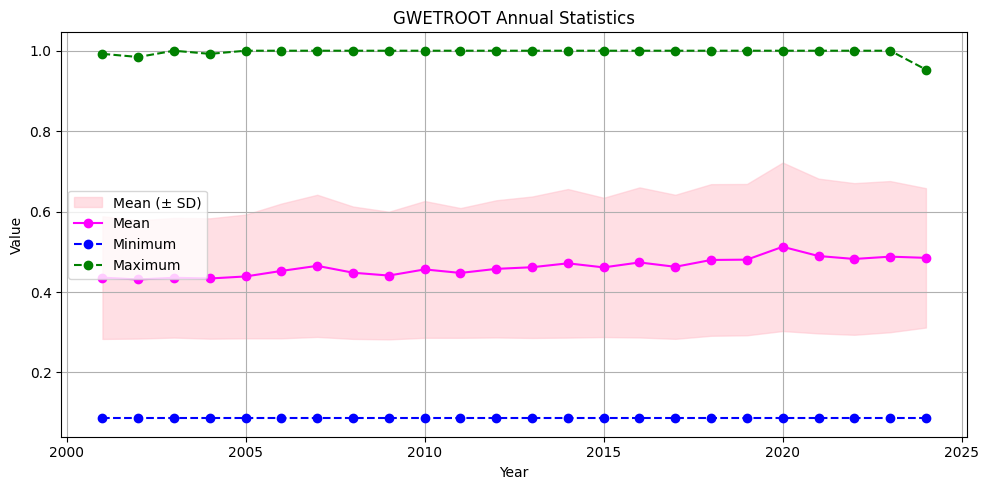

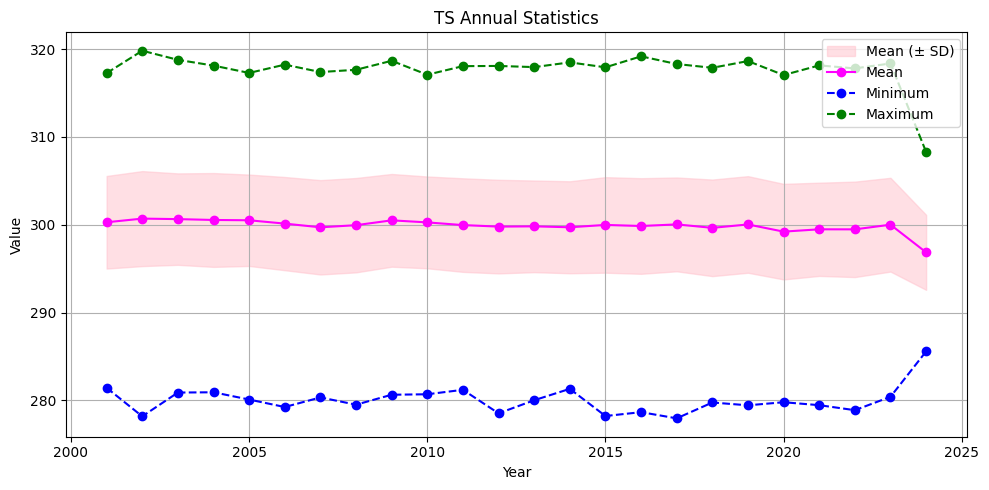

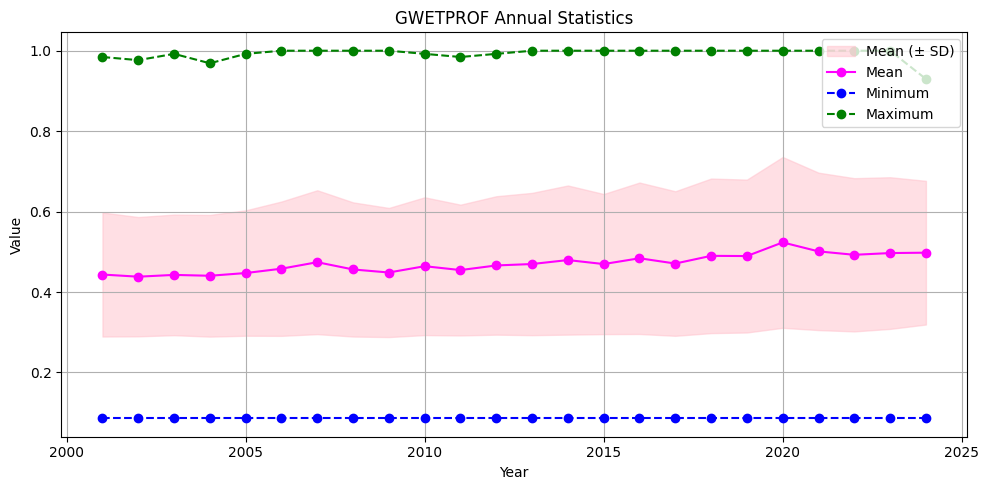

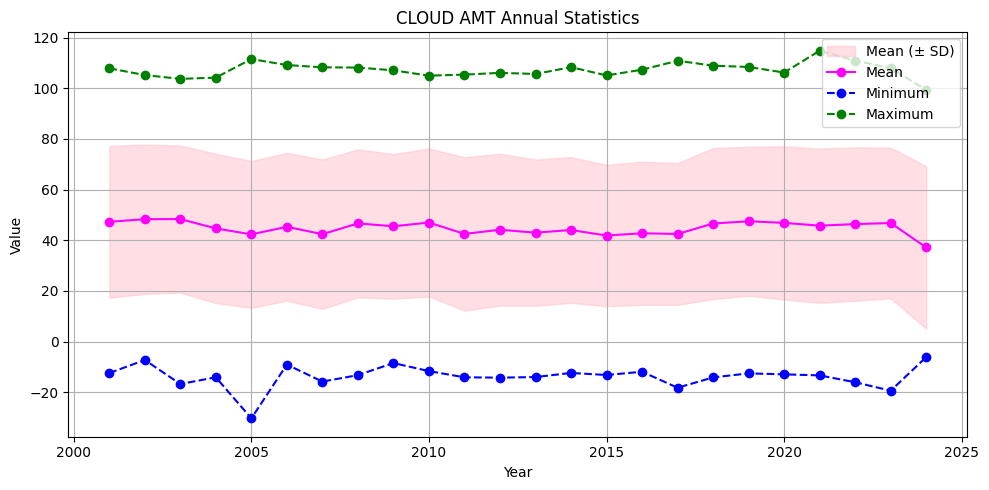

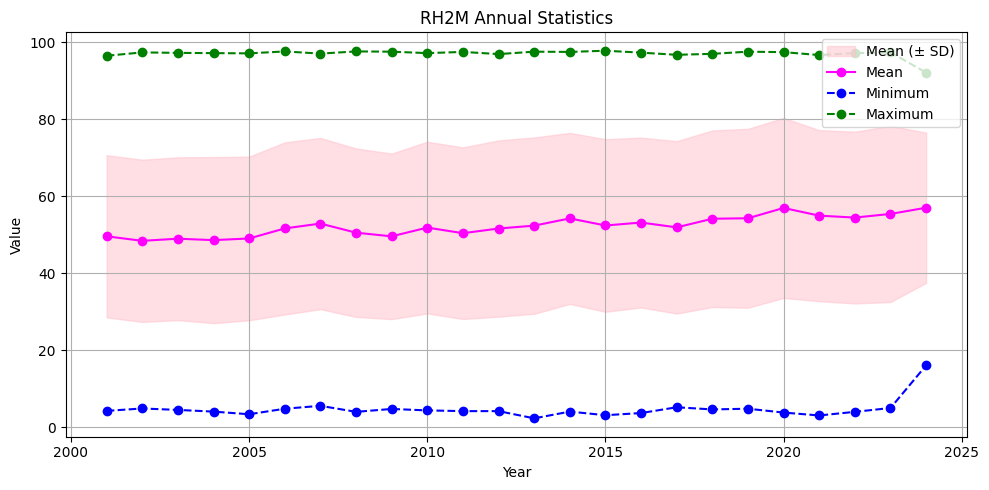

In [11]:
def plot_annual_stats_with_min_max(annual_stats_df):
    """
    This function will loop through each group of variable statistics in the DataFrame and
    create a separate plot for each one, maintaining the order they appear in the DataFrame.

    Args:
    - annual_stats_df (pl.DataFrame): DataFrame with annual statistics for each variable.
    """
    # Identify all the unique variable names by removing known statistical suffixes
    suffixes = ['mean', 'std', 'min', 'max', 'median', 'q25', 'q75']
    variables = set('_'.join(col.split('_')[:-1]) for col in annual_stats_df.columns if col.split('_')[-1] in suffixes)

    # Plot each variable
    for var in variables:
        try:
            # Extract the relevant columns for the current variable
            time = annual_stats_df['time']
            mean = annual_stats_df[f'{var}_mean']
            std = annual_stats_df[f'{var}_std']
            min_val = annual_stats_df[f'{var}_min']
            max_val = annual_stats_df[f'{var}_max']

            # Calculate mean ± std for the shaded area
            mean_plus_std = mean + std
            mean_minus_std = mean - std

            # Plotting
            plt.figure(figsize=(10, 5))
            plt.fill_between(time, mean_minus_std, mean_plus_std, color='pink', alpha=0.5, label='Mean (± SD)')
            plt.plot(time, mean, 'o-', color='magenta', label='Mean')

            # Check if min and max are different from mean
            if not all(mean == min_val):
                plt.plot(time, min_val, 'o--', color='blue', label='Minimum')
            if not all(mean == max_val):
                plt.plot(time, max_val, 'o--', color='green', label='Maximum')

            # Adding labels and title
            plt.title(f"{var.replace('_', ' ')} Annual Statistics")
            plt.xlabel('Year')
            plt.ylabel('Value')
            plt.legend()
            plt.grid(True)
            plt.tight_layout()  # Adjust the plot to ensure everything fits without overlap
            plt.show()

        except KeyError as e:
            print(f"Could not plot variable {var}: {e}")

# Call the function with your dataframe
plot_annual_stats_with_min_max(annual_stats_df)


In [12]:
polars_df.head()

time,lat,lon,EVPTRNS,T2M,TS,PS,WS2M,WS10M,QV2M,RH2M,GWETROOT,GWETPROF,GWETTOP,CLOUD_AMT,ALLSKY_SFC_SW_DWN,PRECTOTCORR_mm
datetime[ns],f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
2001-01-01 00:00:00,-11.5,35.0,35.578125,25.404688,300.203125,92057.3125,1.9765625,2.5234375,0.015808,72.1875,0.640625,0.6328125,0.65625,94.207031,178.519531,0.951856
2001-01-01 00:00:00,-11.5,35.625,74.953125,25.084375,298.835938,93466.0,1.859375,2.8046875,0.016235,77.8125,0.671875,0.6640625,0.6875,96.116211,186.345703,1.583561
2001-01-01 00:00:00,-11.5,36.25,65.9375,24.951563,298.679688,94211.625,2.4140625,3.515625,0.016052,78.3125,0.6796875,0.671875,0.6953125,94.080078,186.628906,2.690817
2001-01-01 00:00:00,-11.5,36.875,67.171875,24.865625,298.59375,95146.0,2.6484375,3.8125,0.016296,80.4375,0.6875,0.671875,0.703125,92.205078,197.992188,4.040025
2001-01-01 00:00:00,-11.5,37.5,46.96875,24.904688,298.46875,96108.0,2.6015625,3.8203125,0.016663,82.25,0.6171875,0.59375,0.6640625,90.4375,216.742188,3.829511


In [13]:
import polars as pl

# Ensure that 'polars_df' is loaded with the proper data structure as shown previously

# Convert the 'time' column from datetime to a year if it's not already in the correct format
polars_df_years = polars_df.with_columns(
    pl.col("time").dt.year().alias("year")
)

# Group by year, latitude, and longitude to calculate mean for each variable
yearly_averages_by_location = (
    polars_df_years
    .group_by(["year", "lat", "lon"])
    .agg([pl.mean(col).alias(f"{col}_avg") for col in polars_df_years.columns if col not in ["time", "lat", "lon", "year"]])
)
# Sort the DataFrame by year, latitude, and longitude
sorted_yearly_averages = yearly_averages_by_location.sort(["year", "lat", "lon"])

sorted_yearly_averages



year,lat,lon,EVPTRNS_avg,T2M_avg,TS_avg,PS_avg,WS2M_avg,WS10M_avg,QV2M_avg,RH2M_avg,GWETROOT_avg,GWETPROF_avg,GWETTOP_avg,CLOUD_AMT_avg,ALLSKY_SFC_SW_DWN_avg,PRECTOTCORR_mm_avg
i32,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
2001,-11.5,35.0,12.873673,23.707813,297.994692,92493.907534,3.28598,4.188934,0.012441,63.696404,0.568515,0.579495,0.458926,58.286162,222.254227,2.099078
2001,-11.5,35.625,22.421618,24.075771,298.301712,93910.926884,2.392701,3.555929,0.012043,63.203938,0.633455,0.663613,0.531271,60.751942,215.605215,2.022575
2001,-11.5,36.25,22.312714,24.368793,298.717958,94645.699144,2.619007,3.812628,0.012275,63.821575,0.638891,0.670655,0.533476,57.735649,218.461018,1.993998
2001,-11.5,36.875,24.044307,24.723973,299.11616,95573.980308,2.739961,3.925214,0.012659,64.886644,0.637072,0.672324,0.533091,55.898775,222.500166,2.05982
2001,-11.5,37.5,22.168001,25.173737,299.623052,96525.17774,2.701627,3.886708,0.012864,64.948288,0.570098,0.600385,0.488399,54.848181,227.328211,2.107322
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
2024,22.0,34.375,0.015625,19.514063,293.992188,96891.25,2.0546875,3.078125,0.007141,53.375,0.2578125,0.2578125,0.1875,0.15625,213.762695,0.0
2024,22.0,35.0,0.0,18.514063,293.1875,94504.25,2.03125,2.9609375,0.008423,64.9375,0.3125,0.3125,0.2421875,0.650391,213.164062,0.00001
2024,22.0,35.625,0.0,18.514063,293.882812,94149.25,2.4140625,3.2890625,0.009277,70.25,0.3203125,0.3203125,0.1640625,1.822266,211.628906,0.0


In [14]:
import polars as pl
import pandas as pd
from geopandas import GeoDataFrame

# Assuming you have your Polars DataFrame as 'df'

# 1. Convert Polars to Pandas DataFrame
df_pandas = sorted_yearly_averages.to_pandas()

# 2. Handle potential geospatial data (modify based on your data)
# Check if there are separate latitude/longitude columns
if 'lat' in df_pandas.columns and 'lon' in df_pandas.columns:
  # Create a Point geometry column from lat/lon
  from shapely.geometry import Point
  df_pandas['geometry'] = df_pandas.apply(lambda row: Point(row['lon'], row['lat']), axis=1)

# If coordinates are encoded differently, adjust the conversion logic here

# 3. Define CRS (coordinate reference system) - optional
crs = "EPSG:4326"  # Replace with appropriate CRS code if known

# 4. Create GeoDataFrame
gdf = GeoDataFrame(df_pandas, geometry='geometry', crs=crs)

# Now you have a GeoDataFrame 'gdf' for further geospatial analysis


In [15]:
gdf

,year,lat,lon,EVPTRNS_avg,T2M_avg,TS_avg,PS_avg,WS2M_avg,WS10M_avg,QV2M_avg,RH2M_avg,GWETROOT_avg,GWETPROF_avg,GWETTOP_avg,CLOUD_AMT_avg,ALLSKY_SFC_SW_DWN_avg,PRECTOTCORR_mm_avg,geometry
0,2001,-11.5,35.000,12.873673,23.707813,297.994692,92493.907534,3.285980,4.188934,0.012441,63.696404,0.568515,0.579495,0.458926,58.286162,222.254227,2.099078,POINT (35.00000 -11.50000)
1,2001,-11.5,35.625,22.421618,24.075771,298.301712,93910.926884,2.392701,3.555929,0.012043,63.203938,0.633455,0.663613,0.531271,60.751942,215.605215,2.022575,POINT (35.62500 -11.50000)
2,2001,-11.5,36.250,22.312714,24.368793,298.717958,94645.699144,2.619007,3.812628,0.012275,63.821575,0.638891,0.670655,0.533476,57.735649,218.461018,1.993998,POINT (36.25000 -11.50000)
3,2001,-11.5,36.875,24.044307,24.723973,299.116160,95573.980308,2.739961,3.925214,0.012659,64.886644,0.637072,0.672324,0.533091,55.898775,222.500166,2.059820,POINT (36.87500 -11.50000)
4,2001,-11.5,37.500,22.168001,25.173737,299.623052,96525.177740,2.701627,3.886708,0.012864,64.948288,0.570098,0.600385,0.488399,54.848181,227.328211,2.107322,POINT (37.50000 -11.50000)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39475,2024,22.0,34.375,0.015625,19.514063,293.992188,96891.250000,2.054688,3.078125,0.007141,53.375000,0.257812,0.257812,0.187500,0.156250,213.762695,0.000000,POINT (34.37500 22.00000)
39476,2024,22.0,35.000,0.000000,18.514063,293.187500,94504.250000,2.031250,2.960938,0.008423,64.937500,0.312500,0.312500,0.242188,0.650391,213.164062,0.000010,POINT (35.00000 22.00000)
39477,2024,22.0,35.625,0.000000,18.514063,293.882812,94149.250000,2.414062,3.289062,0.009277,70.250000,0.320312,0.320312,0.164062,1.822266,211.628906,0.000000,POINT (35.62500 22.00000)
39478,2024,22.0,36.250,0.000000,20.662500,295.562500,97338.250000,2.648438,3.507812,0.009888,66.187500,0.328125,0.328125,0.210938,5.328125,208.816406,0.000010,POINT (36.25000 22.00000)


### What is Surface Soil Wetness

Surface Soil Wetness Daily refers to the percentage of soil moisture present in the surface layer, typically ranging from 0 cm to 5 cm below the ground surface. A value of 0 signifies completely dry soil devoid of water, while a value of 1 represents soil that is fully saturated with water. This metric is essential for understanding immediate moisture conditions at the surface level, influencing factors like plant growth, erosion, and runoff.


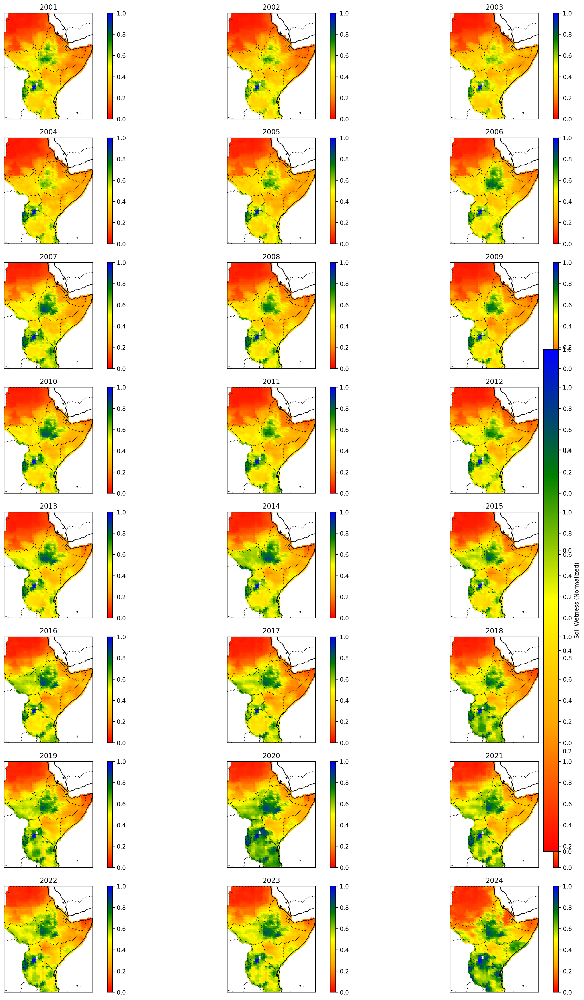

In [23]:
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import cartopy.crs as ccrs
import cartopy.feature as cfeature

def plot_yearly_data(yearly_data, variable_name):
    """
    Plots yearly climate data on a geographical map using a colormap that highlights variations based on the specified variable,
    with geographic extent dynamically set based on the GeoDataFrame bounds.

    Parameters:
    - yearly_data (geopandas.GeoDataFrame): The DataFrame containing the climate data, specifically resampled to yearly averages.
    - variable_name (str): The name of the column to visualize which represents some aspect of climate or environmental data.

    This function visualizes the specified variable for each year on a geographical map.
    """
    colors = ["red", "orange", "yellow", "green", "blue"]
    cmap = LinearSegmentedColormap.from_list("custom", colors, N=256)

    num_years = yearly_data["year"].nunique()
    ncols = 3
    nrows = (num_years + ncols - 1) // ncols
    fig = plt.figure(figsize=(18, 3 * nrows), dpi=200)

    # Automatically calculate the extent from the GeoDataFrame's total bounds
    lon_min, lat_min, lon_max, lat_max = yearly_data.total_bounds
    computed_extent = [lon_min, lon_max, lat_min, lat_max]

    for i, (time, data) in enumerate(yearly_data.groupby("year")):
        ax = fig.add_subplot(nrows, ncols, i + 1, projection=ccrs.PlateCarree())
        ax.coastlines(resolution='10m', color='black', linewidth=1)
        ax.add_feature(cfeature.BORDERS, linestyle=':')
        ax.set_extent(computed_extent, crs=ccrs.PlateCarree())
        
        # Use the specified variable for visualization
        p = data.plot(ax=ax, column=variable_name, transform=ccrs.PlateCarree(), cmap=cmap, vmin=0, vmax=1, legend=True)
        
        ax.set_title(time)

    # Adjust layout to accommodate the colorbar
    plt.tight_layout()

    # Add colorbar axes [left, bottom, width, height]
    # The height is reduced here (for example, from 0.7 to 0.5)
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.5])
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0, vmax=1))
    sm._A = []  # This is necessary for ScalarMappable. 
    fig.colorbar(sm, cax=cbar_ax, label='Soil Wetness (Normalized)')

    plt.show()


# Example usage:
# Assuming your GeoDataFrame is named 'gdf' and you want to visualize 'GWETROOT_avg'
plot_yearly_data(gdf, 'GWETTOP_avg')


### What is Root Zone Soil Wetness?
Root zone soil wetness, measured on a daily scale, is an indicator of the moisture content within the soil layer that extends from the surface to 100 centimeters (cm) below grade. This particular layer is crucial because it encompasses the majority of the root systems for many plants, making it vital for agricultural and hydrological monitoring.

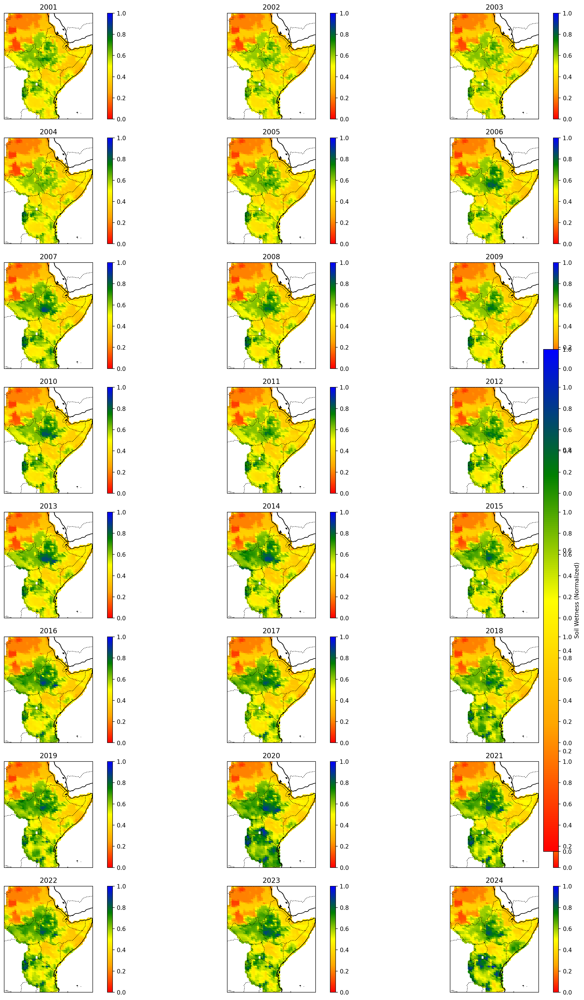

In [24]:
plot_yearly_data(gdf, 'GWETROOT_avg')

In [18]:
def decompose_seasonality_yearly(ds, variable_name):
    """
    Decomposes a given variable from an xarray.Dataset to analyze yearly seasonality.
    
    Parameters:
    - ds (xarray.Dataset): The dataset containing the variable.
    - variable_name (str): The name of the variable to analyze.
    
    This function performs the following steps:
    1. Averages the variable over latitude and longitude dimensions.
    2. Corrects negative values by setting them to zero.
    3. Converts the xarray.DataArray to a pandas DataFrame.
    4. Applies seasonal decomposition on the data with an annual cycle.
    5. Plots the observed data, trend, seasonal, and residual components.
    
    Returns:
    - None: Plots the decomposition components.
    """
    
    # Check if the variable exists in the dataset
    if variable_name not in ds.variables:
        raise ValueError(f"Variable {variable_name} not found in the dataset.")
    
    # Average over the latitude and longitude dimensions
    data = ds[variable_name].mean(dim=['lat', 'lon'])

    # Correct negative values by setting them to zero
    data = data.where(data >= 0, 0)

    # Convert to pandas DataFrame for easier handling in statsmodels
    data_df = data.to_dataframe(name=variable_name).dropna()

    # Decompose the time series to daily data with an annual cycle
    # If the data frequency is daily, use 365 or 366 for leap years
    decomposition = seasonal_decompose(data_df, model='additive', period=365)

    # Plot the decomposed components
    fig, axes = plt.subplots(4, 1, figsize=(12, 8))
    titles = ['Observed', 'Trend', 'Seasonal', 'Residual']
    for ax, component, title in zip(axes, [decomposition.observed, decomposition.trend, decomposition.seasonal, decomposition.resid], titles):
        component.plot(ax=ax, title=title)
        ax.set_ylabel(variable_name)
        ax.label_outer()  # Hide x-labels for top 3 plots for clarity
    plt.tight_layout()
    plt.show()

# Usage example:
# decompose_seasonality_yearly(ds, 'PRECTOTCORR')


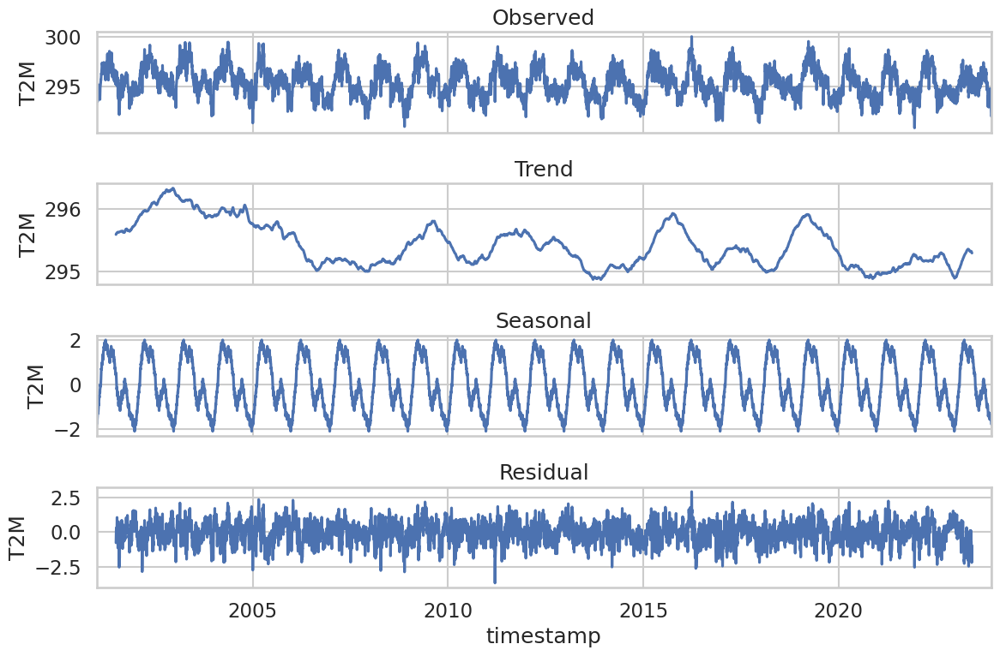

In [19]:
# Usage example:
decompose_seasonality_yearly(ds, 'T2M')

In [35]:
import polars as pl
import plotly.express as px
from typing import List

def seasonal_trend_visualization(df: pl.DataFrame, columns: List[str]):
    """
    Creates seasonal (quarterly over years) trend visualizations for specified columns in a Polars DataFrame.

    Parameters:
    - df (pl.DataFrame): The input DataFrame with a datetime column ('time') and various meteorological data.
    - columns (List[str]): List of column names for which to plot the seasonal trends.

    Displays a line plot showing the seasonal trends over the entire dataset range for each specified column.

    Example of usage:
    # Assuming df is your large DataFrame loaded with the correct datetime format in the 'time' column
    seasonal_trend_visualization(df, ["EVPTRNS", "T2M"])

    Author:
    - Adam Przychodni
    """
    # Check if the 'time' column is of datetime type for proper handling
    if df.schema['time'] != pl.Datetime:
        df = df.with_columns(pl.col("time").str.strptime(pl.datatypes.Datetime))

    # Resample data to quarterly frequency and calculate means for specified columns
    df_grouped = df.groupby([pl.col("time").dt.year(), pl.col("time").dt.quarter()]).agg(
        [pl.col(col).mean().alias(f"{col}_mean") for col in columns]
    )

    # Sort data by year and quarter
    df_grouped = df_grouped.sort(["time_year", "time_quarter"])

    # Plotting each specified column's seasonal trend
    for column in columns:
        fig = px.line(df_grouped, x=pl.col("time_year") * 10 + pl.col("time_quarter"), y=f"{column}_mean",
                      title=f"Seasonal Trend of {column} Over Years",
                      labels={"x": "Year and Quarter", f"{column}_mean": f"Average {column}"})
        fig.update_layout(xaxis_title="Year and Quarter",
                          yaxis_title=f"Average {column}",
                          showlegend=True)
        fig.show()

# Usage of this function will depend on your DataFrame being correctly formatted and loaded


In [36]:
seasonal_trend_visualization(polars_df, ["T2M"])

/tmp/ipykernel_2665/2228388580.py:27: DeprecationWarning:

`groupby` is deprecated. It has been renamed to `group_by`.



DuplicateError: column with name 'time' has more than one occurrences